# Article Relevance Prediction for NeotomaDB

This notebook contains the following tasks:
1. Extract CrossRef metadata of articles that currently exist in Neotoma.csv (positive cases)
2. Extract CrossRef metadata of new articles sent from Simon
3. Extract CrossRef metadata of other negative cases that do not exist in NeotomaDB (negative cases)
4. Data cleaning and saved as csv file
5. Create train test dataset
6. Baseline model: logistic regression with BOW features


### Imports

In [246]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import Image
pd.set_option("display.max_colwidth", 200)

## 1. Extract CrossRef Metadata for Articles in NeotomaDB

The neotoma.csv file is provided by our partner. 

It contains 6889 site records from 2316 sites.

The csv file contains data contributed from 758 distinct articles. 

Note that only 244 of these articles has abstract.

In [247]:
import requests
import json
import os

In [248]:
# load csv
# neotoma = pd.read_csv("../data/hackathon_data/neotoma_crossref_fixed.csv").iloc[:, 0:-2]
# neotoma.info()

In [249]:
# neotoma['doi'].value_counts()

In [250]:
# neotoma['sitename'].value_counts()

### 8 DOI Not Found, Replaced

In [251]:
# dot_status_df = pd.DataFrame(doi_status)
# dot_status_df.query("status_code == 404")['doi'].to_list()

In [252]:
# doi_replace = {
#     '10.2307/1551601\xa0 ' : '10.2307/1551601',
#     '10.2307/1551050\xa0 ' : '10.2307/1551050',
#     '10.1016/j.revpalbo.2004.09.004\xa0 ': '10.1016/j.revpalbo.2004.09.004',
#     '10.1016/j.quascirev.2016.09.023.' : '10.1016/j.quascirev.2016.09.023',
#     'Widga, C., S.N. Lengyel, J. Saunders, G. Hodgins, J.D. Walker, and A.D. Wanamaker. 2017. Late Pleistocene proboscidean population dynamics in the North American Midcontinent. Boreas 46(4):772-782. [DOI: 10.1111/bor.12235]': '10.1111/bor.12235',
#     "Fiedel, S.J. 2018. The spore conundrum: Does a dung fungus decline signal humans' arrival in the Eastern United States?. Quaternary International 466:247e255. [DOI: doi.org/10.1016/j.quaint.2015.11.130]": '10.1016/j.quaint.2015.11.130',
#     'Joyce, D.J. 2006. Chronology and new research on the Schaefer mammoth (? Mammuthus primigenius) site, Kenosha County, Wisconsin, USA,. Quaternary International 142:44-57. [DOI: doi:10.1016/j.quaint.2005.03.004]': '10.1016/j.quaint.2005.03.004',
#     'Overstreet, D.F., and M.F. Kolb. 2003. Geoarchaeological contexts for Late Pleistocene archaeological sites with human‐modified woolly mammoth remains in southeastern Wisconsin, USA. Geoarchaeology 18(1):91-114. [DOI: DOI:10.1002/gea.10052]': '10.1002/gea.10052'
# }
# neotoma['doi'].replace(to_replace=doi_replace, inplace=True)

### Download metadata from CrossRef

In [253]:
# # Query Metadata from DOI
# doi_list = neotoma['doi'].unique().tolist()
# # testing purpose: take the first 10
# # input_doi = doi_list
# input_doi = doi_list

# doi_status = {}
# doi_status['doi'] = input_doi
# doi_status['status_code'] = []

# for doi in input_doi:
#     cross_ref_url = f"https://api.crossref.org/works/{doi}"

#     # make a request to the API
#     cross_ref_response = requests.get(cross_ref_url)

#     doi_status['status_code'].append(cross_ref_response.status_code)

#     if cross_ref_response.status_code == 200:

#         # save data
#         ref_data = cross_ref_response.json()
        
#         # create the directory if it doesn't exist 
#         directory = '../data/raw/crossref'
#         if not os.path.exists(directory):
#             os.makedirs(directory)

#         # save the JSON data to a file
#         doi_clean = doi.replace("/", "_")
#         filename = f'crossref_{doi_clean}.json'
#         filepath = os.path.join(directory, filename)
#         with open(filepath, 'w') as outfile:
#             json.dump(ref_data, outfile)

#     else:
#         print("DOI not found:", doi, "status_code", cross_ref_response.status_code)

### Positive Cases CrossRef Data Import

In [254]:
# Set the directory path
directory_path = "../data/raw/crossref/positive/"
# Get a list of all files and directories in the directory
files_and_directories = os.listdir(directory_path)
# Filter out the directories to get only the files
files = [file for file in files_and_directories if os.path.isfile(os.path.join(directory_path, file))]
if '.DS_Store' in files:
    files.remove('.DS_Store')
len(files)

757

In [255]:
# initialize empty dataframe
neotoma_crossref_df = pd.DataFrame()

# Populate the cross ref df
for f in files:
    file_path = f"../data/raw/crossref/positive/{f}"
    onefile = pd.read_json(file_path)
    onefile = pd.DataFrame(onefile.loc[:, 'message']).T.reset_index()
    
    # merge
    neotoma_crossref_df = pd.concat([neotoma_crossref_df, onefile])

neotoma_crossref_df["target"] = 1

neotoma_crossref_df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 757 entries, 0 to 0
Data columns (total 55 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   index                   757 non-null    object
 1   DOI                     757 non-null    object
 2   ISSN                    745 non-null    object
 3   URL                     757 non-null    object
 4   alternative-id          598 non-null    object
 5   author                  751 non-null    object
 6   container-title         757 non-null    object
 7   content-domain          757 non-null    object
 8   created                 757 non-null    object
 9   deposited               757 non-null    object
 10  indexed                 757 non-null    object
 11  is-referenced-by-count  757 non-null    object
 12  issn-type               745 non-null    object
 13  issue                   673 non-null    object
 14  issued                  757 non-null    object
 15  journal-

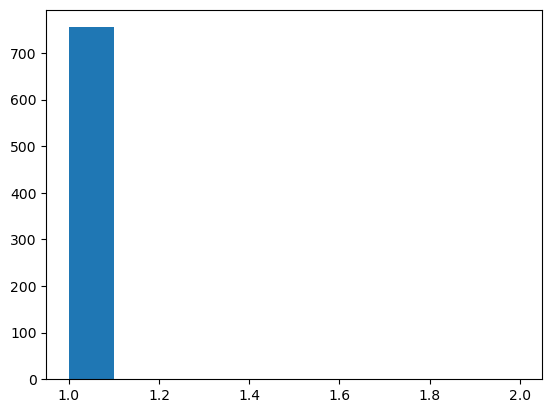

In [256]:
counts = neotoma_crossref_df['DOI'].value_counts()
plt.hist(counts)
plt.show()

### Negative Cases CrossRef Data Import

#### Sample code to search GDD

In [257]:
# #term to search GeoDeepDive
# term = "Animal"
# # Number of articles to return
# n = 100

# response = requests.get("https://geodeepdive.org/api/articles?term=" + term + "&max=" + str(n) + "&type=journal-article")
# if cross_ref_response.status_code == 200:

#         # save data
#         ref_data = response.json()
        
#         # create the directory if it doesn't exist 
#         directory = '../data/raw/negative'
#         if not os.path.exists(directory):
#             os.makedirs(directory)

#         # save the JSON data to a file
#         doi_clean = doi.replace("/", "_")
#         filename = f'crossref_{doi_clean}.json'
#         filepath = os.path.join(directory, filename)
#         with open(filepath, 'w') as outfile:
#             json.dump(ref_data, outfile)

# else:
#     print("DOI not found:", doi, "status_code", cross_ref_response.status_code)

In [258]:
# Set the directory path
directory_path = "../data/raw/crossref/negative/"
# Get a list of all files and directories in the directory
files_and_directories = os.listdir(directory_path)
# Filter out the directories to get only the files
files = [file for file in files_and_directories if os.path.isfile(os.path.join(directory_path, file))]
if '.DS_Store' in files:
    files.remove('.DS_Store')
len(files)

1786

In [259]:
# initialize empty dataframe
negative_crossref_df = pd.DataFrame()

# Populate the cross ref df
for f in files:
    file_path = f"../data/raw/crossref/negative/{f}"
    onefile = pd.read_json(file_path)
    onefile = pd.DataFrame(onefile.loc[:, 'message']).T.reset_index()
    
    # merge
    negative_crossref_df = pd.concat([negative_crossref_df, onefile])
negative_crossref_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1786 entries, 0 to 0
Data columns (total 50 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   index                   1786 non-null   object
 1   DOI                     1786 non-null   object
 2   ISSN                    1784 non-null   object
 3   URL                     1786 non-null   object
 4   archive                 475 non-null    object
 5   author                  1335 non-null   object
 6   container-title         1786 non-null   object
 7   content-domain          1786 non-null   object
 8   created                 1786 non-null   object
 9   deposited               1786 non-null   object
 10  indexed                 1786 non-null   object
 11  is-referenced-by-count  1786 non-null   object
 12  issn-type               1784 non-null   object
 13  issue                   1501 non-null   object
 14  issued                  1786 non-null   object
 15  journal

In [260]:
negative_crossref_df.head(3)

,index,DOI,ISSN,URL,archive,author,container-title,content-domain,created,deposited,...,volume,alternative-id,assertion,funder,update-policy,abstract,editor,published-other,update-to,article-number
0,message,10.1002/chin.201507318,[0931-7597],http://dx.doi.org/10.1002/chin.201507318,[Portico],"[{'given': 'Kristof', 'family': 'Kranjc', 'sequence': 'first', 'affiliation': []}, {'given': 'Marijan Koc', 'family': 'evar', 'sequence': 'additional', 'affiliation': []}]",[ChemInform],"{'domain': [], 'crossmark-restriction': False}","{'date-parts': [[2015, 1, 29]], 'date-time': '2015-01-29T10:38:37Z', 'timestamp': 1422527917000}","{'date-parts': [[2021, 7, 2]], 'date-time': '2021-07-02T09:01:39Z', 'timestamp': 1625216499000}",...,46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,message,10.1002/chem.201590048,[0947-6539],http://dx.doi.org/10.1002/chem.201590048,NaN,"[{'given': 'Jin-Long', 'family': 'Wang', 'sequence': 'first', 'affiliation': []}, {'given': 'Jian-Wei', 'family': 'Liu', 'sequence': 'additional', 'affiliation': []}, {'given': 'Bing-Zhang', 'fami...",[Chemistry - A European Journal],"{'domain': [], 'crossmark-restriction': False}","{'date-parts': [[2015, 3, 12]], 'date-time': '2015-03-12T19:27:18Z', 'timestamp': 1426188438000}","{'date-parts': [[2021, 7, 3]], 'date-time': '2021-07-03T01:59:45Z', 'timestamp': 1625277585000}",...,21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,message,10.1080/13698575.2015.1031645,"[1369-8575, 1469-8331]",http://dx.doi.org/10.1080/13698575.2015.1031645,NaN,"[{'given': 'Davina', 'family': 'Lohm', 'sequence': 'first', 'affiliation': []}, {'given': 'Mark', 'family': 'Davis', 'sequence': 'additional', 'affiliation': []}, {'given': 'Paul', 'family': 'Flow...","[Health, Risk &amp; Society]","{'domain': ['www.tandfonline.com'], 'crossmark-restriction': True}","{'date-parts': [[2015, 4, 15]], 'date-time': '2015-04-15T12:23:23Z', 'timestamp': 1429100603000}","{'date-parts': [[2017, 6, 23]], 'date-time': '2017-06-23T05:27:18Z', 'timestamp': 1498195638000}",...,17,[10.1080/13698575.2015.1031645],"[{'value': 'The publishing and review policy for this title is described in its Aims & Scope.', 'order': 1, 'name': 'peerreview_statement', 'label': 'Peer Review Statement'}, {'value': 'http://www...","[{'name': 'Australia Research Council Discovery Project', 'award': ['DP11010181']}]",http://dx.doi.org/10.1080/tandf_crossmark_01,NaN,NaN,NaN,NaN,NaN


In [261]:
negative_crossref_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1786 entries, 0 to 0
Data columns (total 50 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   index                   1786 non-null   object
 1   DOI                     1786 non-null   object
 2   ISSN                    1784 non-null   object
 3   URL                     1786 non-null   object
 4   archive                 475 non-null    object
 5   author                  1335 non-null   object
 6   container-title         1786 non-null   object
 7   content-domain          1786 non-null   object
 8   created                 1786 non-null   object
 9   deposited               1786 non-null   object
 10  indexed                 1786 non-null   object
 11  is-referenced-by-count  1786 non-null   object
 12  issn-type               1784 non-null   object
 13  issue                   1501 non-null   object
 14  issued                  1786 non-null   object
 15  journal

In [262]:
#Setting target column
negative_crossref_df["target"] = 0
negative_crossref_df.head(3)

,index,DOI,ISSN,URL,archive,author,container-title,content-domain,created,deposited,...,alternative-id,assertion,funder,update-policy,abstract,editor,published-other,update-to,article-number,target
0,message,10.1002/chin.201507318,[0931-7597],http://dx.doi.org/10.1002/chin.201507318,[Portico],"[{'given': 'Kristof', 'family': 'Kranjc', 'sequence': 'first', 'affiliation': []}, {'given': 'Marijan Koc', 'family': 'evar', 'sequence': 'additional', 'affiliation': []}]",[ChemInform],"{'domain': [], 'crossmark-restriction': False}","{'date-parts': [[2015, 1, 29]], 'date-time': '2015-01-29T10:38:37Z', 'timestamp': 1422527917000}","{'date-parts': [[2021, 7, 2]], 'date-time': '2021-07-02T09:01:39Z', 'timestamp': 1625216499000}",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
0,message,10.1002/chem.201590048,[0947-6539],http://dx.doi.org/10.1002/chem.201590048,NaN,"[{'given': 'Jin-Long', 'family': 'Wang', 'sequence': 'first', 'affiliation': []}, {'given': 'Jian-Wei', 'family': 'Liu', 'sequence': 'additional', 'affiliation': []}, {'given': 'Bing-Zhang', 'fami...",[Chemistry - A European Journal],"{'domain': [], 'crossmark-restriction': False}","{'date-parts': [[2015, 3, 12]], 'date-time': '2015-03-12T19:27:18Z', 'timestamp': 1426188438000}","{'date-parts': [[2021, 7, 3]], 'date-time': '2021-07-03T01:59:45Z', 'timestamp': 1625277585000}",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
0,message,10.1080/13698575.2015.1031645,"[1369-8575, 1469-8331]",http://dx.doi.org/10.1080/13698575.2015.1031645,NaN,"[{'given': 'Davina', 'family': 'Lohm', 'sequence': 'first', 'affiliation': []}, {'given': 'Mark', 'family': 'Davis', 'sequence': 'additional', 'affiliation': []}, {'given': 'Paul', 'family': 'Flow...","[Health, Risk &amp; Society]","{'domain': ['www.tandfonline.com'], 'crossmark-restriction': True}","{'date-parts': [[2015, 4, 15]], 'date-time': '2015-04-15T12:23:23Z', 'timestamp': 1429100603000}","{'date-parts': [[2017, 6, 23]], 'date-time': '2017-06-23T05:27:18Z', 'timestamp': 1498195638000}",...,[10.1080/13698575.2015.1031645],"[{'value': 'The publishing and review policy for this title is described in its Aims & Scope.', 'order': 1, 'name': 'peerreview_statement', 'label': 'Peer Review Statement'}, {'value': 'http://www...","[{'name': 'Australia Research Council Discovery Project', 'award': ['DP11010181']}]",http://dx.doi.org/10.1080/tandf_crossmark_01,NaN,NaN,NaN,NaN,NaN,0


### Combine the dataframes & Initial Variable Selection

In [263]:
combined_metadata_df = pd.concat([neotoma_crossref_df, negative_crossref_df])

crossref_keep_col = ['DOI',
 'URL',
 'abstract',
 'author',
 'container-title',
 'is-referenced-by-count', # times cited
 'language',
 'published', # datetime
 'publisher', 
 'subject', # keywords
 'subtitle', # subtitle are missing sometimes
 'title', # article title
 'target'
 ]

metadata_df = combined_metadata_df.loc[:, crossref_keep_col]


### Add Maybe cases to the dataset

Note:
-  all the doi in the newlyprovided csv are new articles
- We will lable "maybe" cases as positive since the cost of their false positive is low

In [264]:
maybe_list1 = pd.read_csv('../data/raw/article_list/pollen_doc_labels.csv')

maybe_list2 = pd.read_csv('../data/raw/article_list/project_2_labeled_data.csv')

combined_maybe = pd.concat([maybe_list1, maybe_list2])

# Get the list of duplicated doi
count = pd.DataFrame(combined_maybe['doi'].value_counts())
dup_doi = count.query('doi >1').index.to_list()

# check if doi exist in previous dois
maybe_list2['duplicated'] = maybe_list2['doi'].apply(lambda x: x in dup_doi)
maybe_list2_new = maybe_list2.query('duplicated == False')
maybe_list2_new.head()

maybe_list = pd.concat([maybe_list1, maybe_list2_new])
maybe_list.shape
# exist_doi = metadata_df['DOI'].to_list()
# dup_list = []
# for doi in maybe_list['doi'].to_list():
#     if doi in exist_doi:
#         dup_list.append(doi)

(1965, 24)

In [265]:
maybe_list['Label'].value_counts()

Not Neotoma      1798
Neotoma            94
Maybe Neotoma      73
Name: Label, dtype: int64

In [266]:
maybe_list['target'] = maybe_list['Label'].apply(lambda x: 1 if x in ['Neotoma', 'Maybe Neotoma'] else 0)
maybe_list['target'].value_counts()

0    1798
1     167
Name: target, dtype: int64

In [267]:
maybe_list = maybe_list.rename(columns={'doi': 'DOI'})

maybe_list.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1965 entries, 0 to 1533
Data columns (total 25 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  1965 non-null   int64  
 1   Text                1965 non-null   object 
 2   pmid                1965 non-null   int64  
 3   DOI                 1940 non-null   object 
 4   abstract            1882 non-null   object 
 5   month               1965 non-null   int64  
 6   year                1965 non-null   int64  
 7   day                 1965 non-null   int64  
 8   jabbrv              1965 non-null   object 
 9   journal             1965 non-null   object 
 10  keywords            1855 non-null   object 
 11  lastname            0 non-null      float64
 12  firstname           0 non-null      float64
 13  address             0 non-null      float64
 14  email               0 non-null      float64
 15  Label               1965 non-null   object 
 16  Pre-Lo

>  We will need: 
> - doi
> - keywords (subject)
> - Text (title)
> - abstract
> - year
> - journal
> - keywords

> Note: Decided to use CrossRef information, not directly from the csv file to replicate the deployment data environment. 


In [268]:
# # Download CrossRef

# # Query Metadata from DOI
# doi_list_new = maybe_list['DOI'].unique().tolist()
# # testing purpose: take the first 10
# # input_doi = doi_list
# input_doi = doi_list_new

# doi_status = {}
# doi_status['DOI'] = input_doi
# doi_status['status_code'] = []

# for doi in input_doi:
#     cross_ref_url = f"https://api.crossref.org/works/{doi}"

#     # make a request to the API
#     cross_ref_response = requests.get(cross_ref_url)

#     doi_status['status_code'].append(cross_ref_response.status_code)

#     if cross_ref_response.status_code == 200:

#         # save data
#         ref_data = cross_ref_response.json()
        
#         # create the directory if it doesn't exist 
#         directory = '../data/raw/crossref/mixed_0512'
#         if not os.path.exists(directory):
#             os.makedirs(directory)

#         # save the JSON data to a file
#         doi_clean = doi.replace("/", "_")
#         filename = f'crossref_{doi_clean}.json'
#         filepath = os.path.join(directory, filename)
#         with open(filepath, 'w') as outfile:
#             json.dump(ref_data, outfile)

#     else:
#         print("DOI not found:", doi, "status_code", cross_ref_response.status_code)

##### Convert new cases into pandas DF

In [269]:
# Convert into Pandas DataFrame

# Set the directory path
directory_path = "../data/raw/crossref/mixed_0512/"
# Get a list of all files and directories in the directory
files_and_directories = os.listdir(directory_path)
# Filter out the directories to get only the files
files = [file for file in files_and_directories if os.path.isfile(os.path.join(directory_path, file))]
if '.DS_Store' in files:
    files.remove('.DS_Store')
len(files)

1919

In [270]:
# initialize empty dataframe
mixed_crossref_df = pd.DataFrame()

# Populate the cross ref df
for f in files:
    file_path = f"../data/raw/crossref/mixed_0512/{f}"
    onefile = pd.read_json(file_path)
    onefile = pd.DataFrame(onefile.loc[:, 'message']).T.reset_index()
    
    # merge
    mixed_crossref_df = pd.concat([mixed_crossref_df, onefile])

mixed_crossref_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1919 entries, 0 to 0
Data columns (total 59 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   index                   1919 non-null   object
 1   DOI                     1919 non-null   object
 2   ISSN                    1914 non-null   object
 3   URL                     1919 non-null   object
 4   alternative-id          1537 non-null   object
 5   assertion               1032 non-null   object
 6   author                  1916 non-null   object
 7   container-title         1919 non-null   object
 8   content-domain          1919 non-null   object
 9   created                 1919 non-null   object
 10  deposited               1919 non-null   object
 11  funder                  1041 non-null   object
 12  indexed                 1919 non-null   object
 13  is-referenced-by-count  1919 non-null   object
 14  issn-type               1914 non-null   object
 15  issue  

In [271]:
# Join target to the Data Frame
mixed_crossref_df['DOI'] = mixed_crossref_df['DOI'].str.lower()
maybe_list['DOI'] = maybe_list['DOI'].str.lower()

mixed_crossref_df_target = pd.merge(mixed_crossref_df, maybe_list, on='DOI')
# mixed_crossref_df_target[['abstract_y', 'abstract_x']].tail()

In [272]:
# join with the rest of the data -> metadata_df
crossref_keep_col = ['DOI',
 'URL',
 'abstract_y',
 'author',
 'container-title',
 'is-referenced-by-count', # times cited
 'language',
 'published', # datetime
 'publisher', 
 'subject', # keywords
 'subtitle', # subtitle are missing sometimes
 'title', # article title
 'target'
 ]

mixdata_df = mixed_crossref_df_target.loc[:, crossref_keep_col].rename(columns={'abstract_y' : 'abstract'})
mixdata_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1919 entries, 0 to 1918
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   DOI                     1919 non-null   object
 1   URL                     1919 non-null   object
 2   abstract                1837 non-null   object
 3   author                  1916 non-null   object
 4   container-title         1919 non-null   object
 5   is-referenced-by-count  1919 non-null   object
 6   language                1739 non-null   object
 7   published               1919 non-null   object
 8   publisher               1919 non-null   object
 9   subject                 1888 non-null   object
 10  subtitle                1919 non-null   object
 11  title                   1919 non-null   object
 12  target                  1919 non-null   int64 
dtypes: int64(1), object(12)
memory usage: 209.9+ KB


In [273]:
metadata_df = pd.concat([metadata_df, mixdata_df])
metadata_df.shape

(4462, 13)

## 2. Data Wrangling - Tidy Data Columns

In [274]:
metadata_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4462 entries, 0 to 1918
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   DOI                     4462 non-null   object
 1   URL                     4462 non-null   object
 2   abstract                2092 non-null   object
 3   author                  4002 non-null   object
 4   container-title         4462 non-null   object
 5   is-referenced-by-count  4462 non-null   object
 6   language                4191 non-null   object
 7   published               4461 non-null   object
 8   publisher               4458 non-null   object
 9   subject                 4368 non-null   object
 10  subtitle                4462 non-null   object
 11  title                   4462 non-null   object
 12  target                  4462 non-null   int64 
dtypes: int64(1), object(12)
memory usage: 488.0+ KB


In [275]:
# Reset index after concatenation
metadata_df = metadata_df.reset_index().drop('index', axis = 1)
metadata_df.head()
metadata_df.index

RangeIndex(start=0, stop=4462, step=1)

| Variable | Description | Preprocessing |
| --- | --- | --- |
| DOI | Digital Object Identifier | Temporarily keep it as primary ID. Will drop it during training. |
| URL | Link to the article | Temporarily keep it in case we need to look into the article. Will drop it during training.|
|abstract | Abstract of the article. Only 244 NeotomaDB articles has it. | Convert to Bag of Words representation|
|author | Author of the article | Consider droping due to duplicate names and various format and spelling |
|container-title | Title of the article's container | Keep as a categorical feature. Apply one-hot encoding|
| content-domain | The publisher's url. | Drop|
| short-container-title | Abbreviated title of the article's container. |Drop since it duplicates the information in container-title|
| is-referenced-by-count| Count of the article being referenced by other article | Keep as a numeric feature.|
| language | Language of the article | Keep as a feature. One hot encoding.|
| published | contain datatime information about when the article is published. | Extract the year and month. Keep as numeric features|
| publisher | Publisher name | Keep as Bag of words feature. |
|subject| What subject the article is about. | Keep as categorical feature. Bag of Words feature. |
| subtitle | Subtitle | Keep as Bag of words feature.|
| title | Title of the article. | Keep as Bag of words feature.|
| type | Tyle of the article (e.g. journal-article) | Drop (since we will focus on journal articles only).|



#### Decisions for Feature Engineering & Feature Selection

- Published year: drop it because both positive and negative cases will have common values for this variable.

- Language: when this information is missing from CrossRef, we use language detector to add it back. Current focus in English articles.

- We decided to join **title, subtitle, abstract** into one descriptive text feature. This solve the problem of missing values and incorporate all descriptive information in a feature.

- We will treat **subject** as a independent variable and use one hot encoding. Subject is related to the journal, not a particular article, but it gives good indication on how the article could possibly related to a topic.

- Authors: There are two options we are trying out: 1. Remove to make the model more generalizable. 2. Using NeotomaDB, get a list of high-frequent(10+)/mid-frequent(3-9)/less-frequent(1-2) author, and create 3 binary features indicating whether the article author contains anyone in the list.
    - Issue with author: when new author start publishing articles in paleo-ecology field, the model may not perform that well. 
    - Possible solutions: 
        - Update the model after a while to account for new authors
        - remove the author to make the model more generalizable
        - Allow Simon's team to customize the high/mid/less-frequent author list in a csv file

    - Decision: Remove author to make the model more generalizable

- Journal: Similar to authors, 
    - Option1: we'd like to convert it to an Ordinal feature, where : 0 = published by a journal that do not currently contributed to Neotoma, 1 means the article is published by a less-frequent journal(only 1), 2 = mid-frequent (2-5), 3 = high frequent (>5)

    - Option2: Prevent using information from exisitng NeotomaDB to avoid introducing bias toward existing records.

    - Decision: Option2. Treat Journal as OHE


In [276]:
metadata_df['subject']

0                                               [Cell Biology, Plant Science, Genetics, Molecular Biology, Animal Science and Zoology, Biochemistry, Ecology, Evolution, Behavior and Systematics]
1                                                                                              [Paleontology, Earth-Surface Processes, Ecology, Evolution, Behavior and Systematics, Oceanography]
2                                                                                                  [Environmental Science (miscellaneous), Ecology, Evolution, Behavior and Systematics, Forestry]
3                                                                                                                                               [General Earth and Planetary Sciences, Archeology]
4                                                                                                                                               [General Earth and Planetary Sciences, Archeology]
                         

### Tidy - Published Year & Month

Note on column "published": 
1. Article 353 from Neotoma has missing published time information, thus manually replaced based on online information.
2. Many articles do not have published month information, thus we will not use this as a feature.

In [277]:
# check missing values in published col
metadata_df[metadata_df['published'].notnull() == False]


,DOI,URL,abstract,author,container-title,is-referenced-by-count,language,published,publisher,subject,subtitle,title,target
353,10.1007/0-387-21710-x_13,http://dx.doi.org/10.1007/0-387-21710-x_13,NaN,"[{'given': 'Ulli M.', 'family': 'Huber', 'sequence': 'first', 'affiliation': []}, {'given': 'Vera', 'family': 'Markgraf', 'sequence': 'additional', 'affiliation': []}]","[Fire and Climatic Change in Temperate Ecosystems of the Western Americas, Ecological Studies]",14,NaN,NaN,Springer-Verlag,NaN,[],"[Holocene Fire Frequency and Climate Change at Rio Rubens Bog, Southern Patagonia]",1


In [278]:
# published is missing for record 0
# need to replace it before extracting date-parts
print(metadata_df.index[metadata_df['published'].notnull() == False])
metadata_df['published'][353] = {'date-parts':[[2003, 0]]}
# metadata_df.iloc[353, :]

Int64Index([353], dtype='int64')


/var/folders/2l/nvvbpy0945b9p2hxcvqg0r640000gn/T/ipykernel_5834/1595980108.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  metadata_df['published'][353] = {'date-parts':[[2003, 0]]}


In [279]:
# Extract year and month
metadata_df['published_year'] = metadata_df['published'].apply(lambda x: int(x['date-parts'][0][0]))

#### Some EDA for published_year

In [280]:
data1 = pd.DataFrame(metadata_df[metadata_df['target'] == 1].loc[:,'published_year'].value_counts().sort_index())
data2 = metadata_df[metadata_df['target'] == 0].loc[:,'published_year'].value_counts().sort_index()
data1


,published_year
1903,1
1951,1
1958,1
1960,1
1962,4
...,...
2019,23
2020,24
2021,41
2022,35


In [281]:
import altair as alt
alt.Chart(metadata_df).mark_bar().encode(
    alt.X('published_year', bin=alt.Bin(maxbins=30)),
    alt.Y('count()')
).facet('target', columns=1)

alt.FacetChart(...)

### Tidy - Affiliation & Authors

Exploring the article counts per author, we noticed that each author has < 30 relevant articles. Each author could also contribute to articles that are not relevant to Neotoma. 
Thus, considering the sparse data problem that OHE could possibly introduce, we decided to find the top 15 most common authors in articles that are relevant to Neotoma, and add a feature "contains_author" = 1 when an article's author is any of the Neotoma common author; =0 otherwise.

In [282]:
# combined_metadata_df["affiliation"]= combined_metadata_df['author'].apply(lambda x: [d["affiliation"] for d in x])

In [283]:
# # combine author names
# from collections import Counter

# def concat_names(l):
#     try:
#         return [d['given'][0] + ' ' + d['family'] for d in l]
#     except:
#         return []

# # combine names for both class
# metadata_df["full_name"] = metadata_df['author'].apply(concat_names)


In [284]:
metadata_df.head(1)

,DOI,URL,abstract,author,container-title,is-referenced-by-count,language,published,publisher,subject,subtitle,title,target,published_year
0,10.2478/s11756-007-0072-x,http://dx.doi.org/10.2478/s11756-007-0072-x,NaN,"[{'given': 'Miroslava', 'family': 'Pražáková', 'sequence': 'first', 'affiliation': []}, {'given': 'Josef', 'family': 'Veselý', 'sequence': 'additional', 'affiliation': []}, {'given': 'Jan', 'famil...",[Biologia],13,en,"{'date-parts': [[2006, 12]]}",Springer Science and Business Media LLC,"[Cell Biology, Plant Science, Genetics, Molecular Biology, Animal Science and Zoology, Biochemistry, Ecology, Evolution, Behavior and Systematics]",[],"[The long-term succession of cladoceran fauna and palaeoclimate forcing: A 14,600-year record from Plešné Lake, the Bohemian Forest]",1,2006


#### Get list of common authors
- Option1: use the authors in neotoma.csv only (comment out)
- Option2: query NeotomaDB, get top authors in the entire database (this notebook)

In [285]:
# Option 1 (Not used in this notebook 
# authors = []

# for i in metadata_df[metadata_df["full_name"].isna() == False]["full_name"]:
#     for author in i:
#         authors.append(author)
# # create counter of authors in positive class
# counter_object = Counter(authors)
# keys = counter_object.keys()
# num_values = len(keys)

# # most common authors
# counter_object.most_common(15)

# most_common = [author[0] for author in counter_object.most_common(15)]
# most_common

In [286]:
# # Option 2: Get a list from Neotoma DB
# all_author = pd.read_csv('../data/raw/article_list/author_names.csv', header=None, skiprows=2)
# all_author['first_name'] = all_author[1].apply(lambda x: str(x)[0])
# all_author['full_name'] = all_author['first_name'] + ' ' + all_author[0]

# all_author.head()

##### Note on encoding the author variable
- since an article could have multiple authors, the features are encoded to 3 binary variables to account for the fact that when multiple authors in the same field contribute the chance of being relevant is higher.

In [287]:
# author_counts = all_author['full_name'].value_counts()
# author_counts

# plt.hist(author_counts, range = (1, 2))
# plt.xlabel('count distribution')
# plt.title('Count of Author Plot')
# plt.show()

In [288]:
# less_freq_author= pd.DataFrame(author_counts).query('full_name <= 2').index.to_list()
# print(f"There are {len(less_freq_author)} less-frequent authors.")

# mid_freq_author= pd.DataFrame(author_counts).query('full_name > 2 & full_name < 10').index.to_list()
# print(f"There are {len(mid_freq_author)} mid-frequent authors.")

# high_freq_author= pd.DataFrame(author_counts).query('full_name >= 10').index.to_list()
# print(f"There are {len(high_freq_author)} high-frequent authors.")


In [289]:
# #creating new binary column to see if article contains most common authors
# metadata_df["less_freq_author"] = metadata_df["full_name"].apply(lambda x: any(item in x for item in less_freq_author) )
# metadata_df["mid_freq_author"] = metadata_df["full_name"].apply(lambda x: any(item in x for item in mid_freq_author) )
# metadata_df["high_freq_author"] = metadata_df["full_name"].apply(lambda x: any(item in x for item in high_freq_author) )

# # Check distribution in two target classes
# metadata_df.groupby('target')['less_freq_author'].sum()

In [290]:
# metadata_df.groupby('target')['mid_freq_author'].sum()

In [291]:
# metadata_df.groupby('target')['high_freq_author'].sum()

### Tidy - Common Jounal Variable

In [292]:
# all_journal = pd.read_csv('../data/raw/article_list/journals.csv', header=None, skiprows=2)

# all_journal.head()


In [293]:
# journal_counts = all_journal[0].value_counts()
# journal_counts_df = pd.DataFrame(journal_counts).rename(columns= {0: "journal"})

# plt.hist(journal_counts_df, range = (2, 10))
# plt.xlabel('count distribution')
# plt.title('Count of Journal')
# plt.show()

> Investigate the break points for journal counts

In [294]:
# less_freq_journal= journal_counts_df.query('journal == 1').index.to_list()
# print(f"There are {len(less_freq_journal)} less-frequent journals.")

# mid_freq_journal= journal_counts_df.query('journal > 1 & journal <= 5').index.to_list()
# print(f"There are {len(mid_freq_author)} mid-frequent journals.")

# high_freq_journal= journal_counts_df.query('journal > 5').index.to_list()
# print(f"There are {len(high_freq_journal)} high-frequent journals.")

In [295]:
# def journal_encoder(journal_name):
#     if journal_name in less_freq_journal:
#         return 1
#     elif journal_name in mid_freq_journal:
#         return 2
#     elif journal_name in high_freq_journal:
#         return 3
#     else:
#         return 0

In [296]:
# # creating new binary column to see if article contains most common journal
# metadata_df["common_journal"] = metadata_df["container-title"].apply(journal_encoder)

# # Check distribution in two target classes
# metadata_df["common_journal"].value_counts

### Feature Engineering - Descriptive Text

Due to the descriptive nature of subject, title, subtitle and abstract, we will create a new text column that concatenate all these descriptive words into a single string for each observation.

In [297]:
# concatenate journal
metadata_df['container-title'] = metadata_df['container-title'].apply(lambda x: ''.join(x))

# concatenate title & subtitle
metadata_df['title_clean'] = metadata_df['title'].apply(lambda x: ''.join(x))
metadata_df['subtitle_clean'] = metadata_df['subtitle'].apply(lambda x: ''.join(x))

# # concatenate abstract (first replace NaN values)
metadata_df['abstract_clean'] = metadata_df['abstract'].fillna(value='')
metadata_df['abstract_clean'] = metadata_df['abstract_clean'].apply(lambda x: ''.join(x))

# # concatenate subject (first replace missing values)
metadata_df['subject_clean'] = metadata_df['subject'].fillna(value='')
metadata_df['subject_clean'] = metadata_df['subject_clean'].apply(lambda x: ' '.join(x))

metadata_df.head(1)

,DOI,URL,abstract,author,container-title,is-referenced-by-count,language,published,publisher,subject,subtitle,title,target,published_year,title_clean,subtitle_clean,abstract_clean,subject_clean
0,10.2478/s11756-007-0072-x,http://dx.doi.org/10.2478/s11756-007-0072-x,NaN,"[{'given': 'Miroslava', 'family': 'Pražáková', 'sequence': 'first', 'affiliation': []}, {'given': 'Josef', 'family': 'Veselý', 'sequence': 'additional', 'affiliation': []}, {'given': 'Jan', 'famil...",Biologia,13,en,"{'date-parts': [[2006, 12]]}",Springer Science and Business Media LLC,"[Cell Biology, Plant Science, Genetics, Molecular Biology, Animal Science and Zoology, Biochemistry, Ecology, Evolution, Behavior and Systematics]",[],"[The long-term succession of cladoceran fauna and palaeoclimate forcing: A 14,600-year record from Plešné Lake, the Bohemian Forest]",1,2006,"The long-term succession of cladoceran fauna and palaeoclimate forcing: A 14,600-year record from Plešné Lake, the Bohemian Forest",,,"Cell Biology Plant Science Genetics Molecular Biology Animal Science and Zoology Biochemistry Ecology, Evolution, Behavior and Systematics"


##### Clean up json tags in abstract raw text using RegEx

In [298]:
metadata_df['abstract_clean'] = metadata_df['abstract_clean'].str.replace(pat = '<(jats|/jats):(p|sec|title|italic|sup|sub)>', repl = ' ')
metadata_df['abstract_clean'] = metadata_df['abstract_clean'].str.replace(pat = '<(jats|/jats):(list|inline-graphic|related-article).*>', repl = ' ')

# All Cleaned
metadata_df['abstract_clean'][metadata_df['abstract_clean'].str.contains('jats')]

/var/folders/2l/nvvbpy0945b9p2hxcvqg0r640000gn/T/ipykernel_5834/492611570.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  metadata_df['abstract_clean'] = metadata_df['abstract_clean'].str.replace(pat = '<(jats|/jats):(p|sec|title|italic|sup|sub)>', repl = ' ')
/var/folders/2l/nvvbpy0945b9p2hxcvqg0r640000gn/T/ipykernel_5834/492611570.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  metadata_df['abstract_clean'] = metadata_df['abstract_clean'].str.replace(pat = '<(jats|/jats):(list|inline-graphic|related-article).*>', repl = ' ')


Series([], Name: abstract_clean, dtype: object)

> In this step, we did not join abstract with the text to investigate model performance when abstract is not used as a feature

In [299]:
metadata_df['has_abstract'] = metadata_df["abstract"].isnull().astype(int)
metadata_df["has_abstract"].value_counts()


1    2370
0    2092
Name: has_abstract, dtype: int64

In [300]:
# create description text column WITHOUT Subject
metadata_df['text_with_abstract'] =  metadata_df['title_clean'] + ' ' + metadata_df['subtitle_clean'] + ' ' + metadata_df['abstract_clean']
metadata_df['text_wo_abstract'] =  metadata_df['title_clean'] + ' ' + metadata_df['subtitle_clean']

In [301]:
metadata_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4462 entries, 0 to 4461
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   DOI                     4462 non-null   object
 1   URL                     4462 non-null   object
 2   abstract                2092 non-null   object
 3   author                  4002 non-null   object
 4   container-title         4462 non-null   object
 5   is-referenced-by-count  4462 non-null   object
 6   language                4191 non-null   object
 7   published               4462 non-null   object
 8   publisher               4458 non-null   object
 9   subject                 4368 non-null   object
 10  subtitle                4462 non-null   object
 11  title                   4462 non-null   object
 12  target                  4462 non-null   int64 
 13  published_year          4462 non-null   int64 
 14  title_clean             4462 non-null   object
 15  subt

### Tidy - Language

Most of the articles are English. Thus we will drop this column.

In [302]:
# Use language detector 
from langdetect import detect

In [303]:
def lang_impute(cell_value):
    if len(cell_value.strip()) == 0:
        return 'NA'
    else:
        if 'en' in detect(cell_value):
            return 'en'
        else:
            return 'NA'

metadata_df['detectlang'] = metadata_df['text_with_abstract'].apply(lambda x: lang_impute(x))

In [304]:
metadata_df.query('detectlang == False & language == "en"').shape

(0, 22)

In [305]:
metadata_df.query('language != "en"').head()

,DOI,URL,abstract,author,container-title,is-referenced-by-count,language,published,publisher,subject,...,target,published_year,title_clean,subtitle_clean,abstract_clean,subject_clean,has_abstract,text_with_abstract,text_wo_abstract,detectlang
11,10.1016/b978-0-08-020498-7.50013-3,http://dx.doi.org/10.1016/b978-0-08-020498-7.50013-3,NaN,"[{'given': 'W.', 'family': 'PENNINGTON', 'sequence': 'first', 'affiliation': []}]",Studies in the Scottish Lateglacial Environment,31,NaN,{'date-parts': [[1977]]},Elsevier,NaN,...,1,1977,Lake Sediments and the Lateglacial Environment in Northern Scotland,,,,1,Lake Sediments and the Lateglacial Environment in Northern Scotland,Lake Sediments and the Lateglacial Environment in Northern Scotland,en
16,10.2307/2484166,http://dx.doi.org/10.2307/2484166,NaN,"[{'given': 'Emily W. B.', 'family': 'Russell', 'sequence': 'first', 'affiliation': []}]",Bulletin of the Torrey Botanical Club,16,NaN,"{'date-parts': [[1980, 7]]}",JSTOR,[Plant Science],...,1,1980,Vegetational Change in Northern New Jersey from Precolonization to the Present: A Palynological Interpretation,,,Plant Science,1,Vegetational Change in Northern New Jersey from Precolonization to the Present: A Palynological Interpretation,Vegetational Change in Northern New Jersey from Precolonization to the Present: A Palynological Interpretation,en
20,10.3389/fevo.2018.00111,http://dx.doi.org/10.3389/fevo.2018.00111,NaN,"[{'given': 'S. Yoshi', 'family': 'Maezumi', 'sequence': 'first', 'affiliation': []}, {'given': 'Mark', 'family': 'Robinson', 'sequence': 'additional', 'affiliation': []}, {'given': 'Jonas', 'famil...",Frontiers in Ecology and Evolution,30,NaN,"{'date-parts': [[2018, 8, 3]]}",Frontiers Media SA,"[Ecology, Ecology, Evolution, Behavior and Systematics]",...,1,2018,New Insights From Pre-Columbian Land Use and Fire Management in Amazonian Dark Earth Forests,,,"Ecology Ecology, Evolution, Behavior and Systematics",1,New Insights From Pre-Columbian Land Use and Fire Management in Amazonian Dark Earth Forests,New Insights From Pre-Columbian Land Use and Fire Management in Amazonian Dark Earth Forests,en
63,10.7202/032831ar,http://dx.doi.org/10.7202/032831ar,"<jats:p>Remains of white-tailed deer (Odocoileus virginianus), meadow voles (Microtus pennsylvanicus), muskrat (Ondatra zibethicus) and Blanding's turtle (Emydoidea blandingi) have been recovered ...","[{'given': 'Charles S.', 'family': 'Churcher', 'sequence': 'first', 'affiliation': []}, {'given': 'Jerry J.', 'family': 'Pilny', 'sequence': 'additional', 'affiliation': []}, {'given': 'Alan V.', ...",ArticlesGéographie physique et Quaternaire,4,NaN,"{'date-parts': [[2007, 12, 18]]}",Consortium Erudit,"[Paleontology, Geology]",...,1,2007,"Late Pleistocene Vertebrate, Plant and Insect Remains from the lnnerkip Site, Southwestern Ontario",,"Remains of white-tailed deer (Odocoileus virginianus), meadow voles (Microtus pennsylvanicus), muskrat (Ondatra zibethicus) and Blanding's turtle (Emydoidea blandingi) have been recovered from a ...",Paleontology Geology,0,"Late Pleistocene Vertebrate, Plant and Insect Remains from the lnnerkip Site, Southwestern Ontario Remains of white-tailed deer (Odocoileus virginianus), meadow voles (Microtus pennsylvanicus), ...","Late Pleistocene Vertebrate, Plant and Insect Remains from the lnnerkip Site, Southwestern Ontario",en
77,10.4095/297451,http://dx.doi.org/10.4095/297451,NaN,"[{'given': 'R', 'family': 'Bell', 'sequence': 'first', 'affiliation': []}]",,0,NaN,{'date-parts': [[1903]]},Natural Resources Canada/CMSS/Information Management,NaN,...,1,1903,Summary report of the operations of the Geological Survey for the calendar year 1902,,,,1,Summary report of the operations of the Geological Survey for the calendar year 1902,Summary report of the operations of the Geological Survey for the calendar year 1902,en


In [306]:
metadata_df['language'] = metadata_df['language'].fillna(metadata_df['detectlang']).replace(True, 'en')
metadata_df['language'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 4462 entries, 0 to 4461
Series name: language
Non-Null Count  Dtype 
--------------  ----- 
4462 non-null   object
dtypes: object(1)
memory usage: 35.0+ KB


In [307]:
# With Imputed Language, Filter out non-english articles
metadata_df = metadata_df.query('language == "en"')
metadata_df.shape

(4434, 22)

### Tidy - Publisher

We noticed that the major publishers will publish both relevant and non-relevant articles. This variable might not be too informative for the classification task.

We decided to:
- Drop this feature for logistic regression model since it will introduce data sparsity.
- May keep this feature for more sophisticated ML models and try if it could improve model performance.

In [308]:
metadata_df.groupby('target')['publisher'].value_counts()

metadata_df.query("publisher == 'Elsevier BV'")['target'].value_counts()

0    737
1    204
Name: target, dtype: int64

### Feature Engineer - Transformer Based

In [385]:
from transformers import pipeline, set_seed
from transformers import GPT2Tokenizer, GPT2Model

set_seed(42)
classifier = pipeline(model="facebook/bart-large-mnli")

In [ ]:

metadata_df['prob_paleoecology'] = metadata_df['text_with_abstract'].apply(lambda x: classifier(x, candidate_labels=["paleoecology"]))

In [ ]:
metadata_df['prob_paleoenvironment'] = metadata_df['text_with_abstract'].apply(lambda x: classifier(x, candidate_labels=["paleoenvironment"]))

### Save Cleaned Data

In [309]:
# saving processed dataframe
directory = '../data/processed'
if not os.path.exists(directory):
    os.makedirs(directory)

metadata_df.to_csv("../data/processed/metadata_processed.csv")

## 3. Create Training and Testing Data for Baseline Model

Note: Also dropped container-title (journal name) to evaluate if the binary common_journal help reduce dimension.

In [310]:
metadata_df.columns

Index(['DOI', 'URL', 'abstract', 'author', 'container-title',
       'is-referenced-by-count', 'language', 'published', 'publisher',
       'subject', 'subtitle', 'title', 'target', 'published_year',
       'title_clean', 'subtitle_clean', 'abstract_clean', 'subject_clean',
       'has_abstract', 'text_with_abstract', 'text_wo_abstract', 'detectlang'],
      dtype='object')

In [311]:
training_keepcol = [
       'is-referenced-by-count', 
       'has_abstract', 
       'container-title',
       'language', 
       'subject_clean',
       'text_with_abstract', 
       'text_wo_abstract',
       'target']

metadata_df_cleaned = metadata_df.loc[:, training_keepcol]

metadata_df_cleaned.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 4434 entries, 0 to 4461
Data columns (total 8 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   is-referenced-by-count  4434 non-null   object
 1   has_abstract            4434 non-null   int64 
 2   container-title         4434 non-null   object
 3   language                4434 non-null   object
 4   subject_clean           4434 non-null   object
 5   text_with_abstract      4434 non-null   object
 6   text_wo_abstract        4434 non-null   object
 7   target                  4434 non-null   int64 
dtypes: int64(2), object(6)
memory usage: 311.8+ KB


In [312]:
# metadata_df_cleaned.head(2)

#### Imports for Baseline Model

In [313]:
from sklearn.dummy import DummyClassifier
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import (
    GridSearchCV,
    RandomizedSearchCV,
    cross_validate,
    cross_val_score,
    train_test_split,
)
from sklearn.pipeline import Pipeline, make_pipeline

### Train-Test Split

0.2: small sample

In [314]:
train_df, test_df = train_test_split(metadata_df_cleaned, test_size=0.2, random_state=123)
train_df.head()

,is-referenced-by-count,has_abstract,container-title,language,subject_clean,text_with_abstract,text_wo_abstract,target
3408,0,0,Scientific Reports,en,Multidisciplinary,Ancient mitochondrial diversity reveals population homogeneity in Neolithic Greece and identifies population dynamics along the Danubian expansion axis The aim of the study is to investigate mito...,Ancient mitochondrial diversity reveals population homogeneity in Neolithic Greece and identifies population dynamics along the Danubian expansion axis,0
1627,4,1,Journal of Post Keynesian Economics,en,Economics and Econometrics,Biological Analogies in Economics: A Comment,Biological Analogies in Economics: A Comment,0
2784,0,0,Clinical and Translational Allergy,en,Immunology and Allergy Immunology Pulmonary and Respiratory Medicine,Understanding and controlling asthma in Latin America: A review of recent research informed by the SCAALA programme Asthma is an important health concern in Latin America (LA) where it is associa...,Understanding and controlling asthma in Latin America: A review of recent research informed by the SCAALA programme,0
902,0,1,Journal of Economic Methodology,en,"Economics, Econometrics and Finance (miscellaneous)",Economic rebel in retrospect,Economic rebel in retrospect,0
4044,0,0,Marine Environmental Research,en,Pollution Aquatic Science General Medicine Oceanography,Effect of dissolved organic nutrients on the bloom of Prorocentrum donghaiense in the East China Sea coastal waters Prorocentrum donghaiense blooms occur annually in the East China Sea coastal wa...,Effect of dissolved organic nutrients on the bloom of Prorocentrum donghaiense in the East China Sea coastal waters,0


## 4. More EDA for Train Split

In [315]:
train_df.sort_index()
train_df.info() # check non-null 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3547 entries, 3408 to 3608
Data columns (total 8 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   is-referenced-by-count  3547 non-null   object
 1   has_abstract            3547 non-null   int64 
 2   container-title         3547 non-null   object
 3   language                3547 non-null   object
 4   subject_clean           3547 non-null   object
 5   text_with_abstract      3547 non-null   object
 6   text_wo_abstract        3547 non-null   object
 7   target                  3547 non-null   int64 
dtypes: int64(2), object(6)
memory usage: 249.4+ KB


In [316]:
pos_df = train_df[train_df["target"] == 1]
neg_df = train_df[train_df["target"] == 0]

In [317]:
print("With Abstract")
sorted_pos_df = pos_df.reindex(pos_df.text_with_abstract.str.len().sort_values().index)
sorted_neg_df = neg_df.reindex(neg_df.text_with_abstract.str.len().sort_values().index)
avg_pos_len = pos_df.text_with_abstract.str.len().mean()
avg_neg_len = neg_df.text_with_abstract.str.len().mean()
print(avg_pos_len)
print(avg_neg_len)

print("Without Abstract")
sorted_pos_df = pos_df.reindex(pos_df.text_wo_abstract.str.len().sort_values().index)
sorted_neg_df = neg_df.reindex(neg_df.text_wo_abstract.str.len().sort_values().index)
avg_pos_len = pos_df.text_wo_abstract.str.len().mean()
avg_neg_len = neg_df.text_wo_abstract.str.len().mean()
print(avg_pos_len)
print(avg_neg_len)


With Abstract
725.6287671232876
848.457933972311
Without Abstract
109.52876712328766
95.18068867589635


In [318]:
sorted_pos_df.head()

,is-referenced-by-count,has_abstract,container-title,language,subject_clean,text_with_abstract,text_wo_abstract,target
415,25,0,Radiocarbon,en,General Earth and Planetary Sciences Archeology,"Groningen Radiocarbon Dates VIII This list contains dates for Latin America which have mainly been measured during the past few years. The results are grouped into three categories: geologic, ar...",Groningen Radiocarbon Dates VIII,1
709,7,1,Geoscience and Man,en,,In search of a palynological tundra,In search of a palynological tundra,1
369,2,1,,en,,Descriptions of WHOI sediment cores,Descriptions of WHOI sediment cores,1
443,3,1,Grana,en,"Plant Science Ecology, Evolution, Behavior and Systematics","5. Kožlí (S. Bohemia, Czech Republic)","5. Kožlí (S. Bohemia, Czech Republic)",1
446,28,1,Quarterly Journal of the Royal Meteorological Society,en,Atmospheric Science,Trees and climatic history in scotland,Trees and climatic history in scotland,1


In [319]:
sorted_neg_df.head()

,is-referenced-by-count,has_abstract,container-title,language,subject_clean,text_with_abstract,text_wo_abstract,target
1572,0,1,Concurrency and Computation: Practice and Experience,en,Computational Theory and Mathematics Computer Networks and Communications Computer Science Applications Theoretical Computer Science Software,Note,Note,0
1465,0,1,Anthrozoös,en,Sociology and Political Science Veterinary (miscellaneous) Animal Science and Zoology Anthropology Education,Index,Index,0
1740,0,1,Journal of Post Keynesian Economics,en,Economics and Econometrics,Reply,Reply,0
972,0,1,Veterinary Clinics of North America: Exotic Animal Practice,en,General Medicine Small Animals,Index,Index,0
945,0,1,Space Research Today,en,Space and Planetary Science Aerospace Engineering,Awards,Awards,0


#### Word Cloud

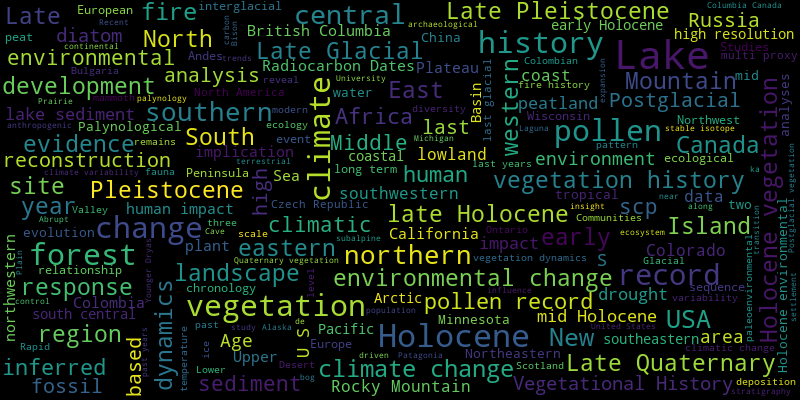

In [320]:
from wordcloud import WordCloud

pos_text = " ".join(train_df[train_df["target"] == 1]["text_wo_abstract"].tolist())
neg_text = " ".join(train_df[train_df["target"] == 0]["text_wo_abstract"].tolist())

wordcloud = WordCloud(max_font_size=40, width=800, height=400)
wordcloud.generate(pos_text).to_image()

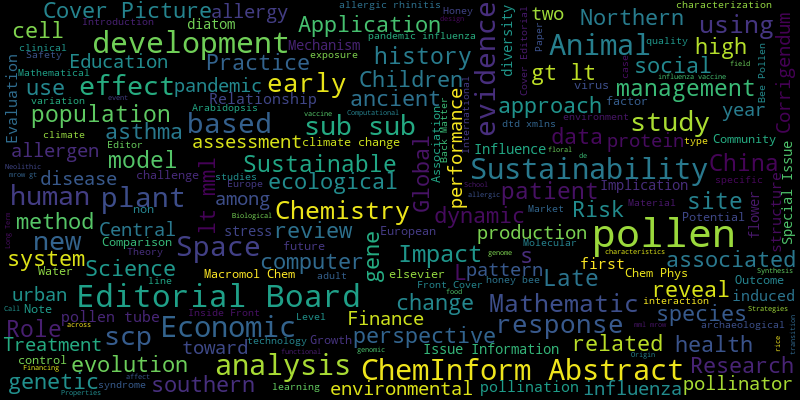

In [321]:
wordcloud.generate(neg_text).to_image()

#### Examine class distribution in train split

In [322]:
train_df["target"].value_counts(normalize=True)

0    0.794192
1    0.205808
Name: target, dtype: float64

## 5. Baseline Modelling

In [323]:
train_df.columns

Index(['is-referenced-by-count', 'has_abstract', 'container-title', 'language',
       'subject_clean', 'text_with_abstract', 'text_wo_abstract', 'target'],
      dtype='object')

##### Split X and y

- Using Text Without Abstract
- Use ordinal journal & 3-category author

In [324]:
# No author, Subject separate, language imputed, journal separate
feature = ['is-referenced-by-count', 'has_abstract', 'container-title', 
       'subject_clean', 'text_with_abstract', 'text_wo_abstract']

X_train, y_train = train_df[feature], train_df["target"]
X_test, y_test = test_df[feature], test_df["target"]

##### Define Pre-Processing Pipeline

In [344]:
from sklearn.compose import make_column_transformer  
from sklearn.preprocessing import OneHotEncoder, StandardScaler, OrdinalEncoder

# Dividing the feature types
text_feature = "text_with_abstract" # BOW
subject_feature = 'subject_clean' # BOW
binary_feature = ['has_abstract'] # OHE binary
numeric_features = ["is-referenced-by-count"] #numeric
ohe_features = ['container-title'] # journal name OHE

# Transformers
binary_transformer = OneHotEncoder(drop='if_binary', dtype = int)
ohe_transformer = OneHotEncoder(handle_unknown="ignore", sparse=False, dtype = int)
numeric_transformer = StandardScaler()
subject_transformer = CountVectorizer(stop_words="english", max_features= 100)
text_transformer = CountVectorizer(stop_words="english", max_features= 100)

# author_levels = [0,1,2,3]
# ordinal_transformer = OrdinalEncoder(categories=[author_levels], dtype=int)

# Create the column transformer
preprocessor = make_column_transformer(
    (numeric_transformer, numeric_features),
    (binary_transformer, binary_feature),
    (ohe_transformer, ohe_features),
    (subject_transformer, subject_feature),
    (text_transformer, text_feature)
)

preprocessor

ColumnTransformer(transformers=[('standardscaler', StandardScaler(),
                                 ['is-referenced-by-count']),
                                ('onehotencoder-1',
                                 OneHotEncoder(drop='if_binary',
                                               dtype=<class 'int'>),
                                 ['has_abstract']),
                                ('onehotencoder-2',
                                 OneHotEncoder(dtype=<class 'int'>,
                                               handle_unknown='ignore',
                                               sparse=False),
                                 ['container-title']),
                                ('countvectorizer-1',
                                 CountVectorizer(max_features=100,
                                                 stop_words='english'),
                                 'subject_clean'),
                                ('countvectorizer-2',
                                 CountVectorizer(max_features=100,
                                                 stop_words='english'),
                                 'text_with_abstract')])

##### Check Transformed Data

In [345]:
transformed_X_train = preprocessor.fit_transform(X_train)
transformed_X_train

/Users/kw/opt/miniconda3/envs/591/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


array([[-0.38235357,  0.        ,  0.        , ...,  1.        ,
         0.        ,  0.        ],
       [-0.28182669,  1.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [-0.38235357,  0.        ,  0.        , ...,  1.        ,
         1.        ,  0.        ],
       ...,
       [-0.38235357,  1.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [-0.38235357,  0.        ,  0.        , ...,  0.        ,
         1.        ,  0.        ],
       [-0.38235357,  0.        ,  0.        , ...,  2.        ,
         0.        ,  0.        ]])

In [346]:
col_names = (numeric_features + 
             preprocessor.named_transformers_["onehotencoder-1"].get_feature_names_out().tolist() + 
             preprocessor.named_transformers_["onehotencoder-2"].get_feature_names_out().tolist() + 
             preprocessor.named_transformers_["countvectorizer-1"].get_feature_names_out().tolist() +
            preprocessor.named_transformers_["countvectorizer-2"].get_feature_names_out().tolist()

             )
len(col_names)

1375

In [347]:

transformed_X_train_df = pd.DataFrame(transformed_X_train, columns=col_names)
transformed_X_train_df.head(3)

,is-referenced-by-count,has_abstract_1,container-title_,container-title_AAPS PharmSciTech,container-title_ACS Applied Materials &amp; Interfaces,container-title_ACS Chemical Biology,container-title_ACS Omega,container-title_ACS Synthetic Biology,container-title_ANZ Journal of Surgery,container-title_ARCTIC,...,treatment,use,used,using,vegetation,water,x2009,xa0,years,yr
0,-0.382354,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,-0.281827,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-0.382354,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0


#### Logistic Regression

In [348]:
from sklearn.linear_model import LogisticRegression 

# The model pipeline

logreg_model = make_pipeline(preprocessor, LogisticRegression(max_iter=1000, random_state=123))

# The mean and std of the cross validated scores for all metrics as a dataframe

classification_metrics = ["accuracy", "precision", "recall", "f1"]

cross_val_results= {}
cross_val_results['logreg'] = pd.DataFrame(
    cross_validate(
        logreg_model,
        X_train,
        y_train,
        scoring=classification_metrics,
        return_train_score=True
    )
).agg(['mean', 'std']).round(3).T

cross_val_results['logreg']

/Users/kw/opt/miniconda3/envs/591/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/Users/kw/opt/miniconda3/envs/591/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/Users/kw/opt/miniconda3/envs/591/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/Users/kw/opt/miniconda3/envs/591/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sp

,mean,std
fit_time,0.514,0.033
score_time,0.084,0.002
test_accuracy,0.939,0.013
train_accuracy,0.966,0.004
test_precision,0.881,0.049
train_precision,0.954,0.010
test_recall,0.816,0.027
train_recall,0.879,0.011
test_f1,0.847,0.030
train_f1,0.915,0.010


#### LogReg - Preliminary investigation on feature importance for Logistic Regression

In [349]:
model_params = logreg_model.named_steps['logisticregression'].get_params()
model_params

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 1000,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': 123,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [350]:
logreg_model.fit(X_train, y_train)

/Users/kw/opt/miniconda3/envs/591/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('standardscaler',
                                                  StandardScaler(),
                                                  ['is-referenced-by-count']),
                                                 ('onehotencoder-1',
                                                  OneHotEncoder(drop='if_binary',
                                                                dtype=<class 'int'>),
                                                  ['has_abstract']),
                                                 ('onehotencoder-2',
                                                  OneHotEncoder(dtype=<class 'int'>,
                                                                handle_unknown='ignore',
                                                                sparse=False),
                                                  ['container-title']),
                                                 ('countvectorizer-1',
                                                  CountVectorizer(max_features=100,
                                                                  stop_words='english'),
                                                  'subject_clean'),
                                                 ('countvectorizer-2',
                                                  CountVectorizer(max_features=100,
                                                                  stop_words='english'),
                                                  'text_with_abstract')])),
                ('logisticregression',
                 LogisticRegression(max_iter=1000, random_state=123))])

In [353]:
data = {
    "coefficient": logreg_model.named_steps["logisticregression"].coef_.flatten().tolist(),
    "magnitude": np.absolute(
        logreg_model.named_steps["logisticregression"].coef_.flatten().tolist()
    ),
}
coef_df = pd.DataFrame(data, index=col_names).sort_values(
    "magnitude", ascending=False
)

# Top 30 features contributing for positive class
coef_df.query('coefficient > 0').head(30)

,coefficient,magnitude
paleontology,2.126710,2.126710
container-title_Radiocarbon,1.861743,1.861743
aquatic,1.660084,1.660084
geology,1.648164,1.648164
container-title_Plains Anthropologist,1.614399,1.614399
lake,1.563855,1.563855
has_abstract_1,1.553269,1.553269
container-title_New Phytologist,1.467288,1.467288
archeology,1.456039,1.456039
earth,1.373367,1.373367


In [354]:
# Top 30 features contributing for negative class
coef_df.query('coefficient < 0').head(30)

,coefficient,magnitude
showed,-1.754875,1.754875
mathematics,-1.588459,1.588459
container-title_American Journal of Botany,-1.473689,1.473689
engineering,-1.350533,1.350533
"container-title_CLEAN - Soil, Air, Water",-1.344895,1.344895
economics,-1.217441,1.217441
econometrics,-1.217441,1.217441
container-title_Global Ecology and Biogeography,-1.185541,1.185541
social,-1.175736,1.175736
container-title_Ecological Indicators,-1.164093,1.164093


#### Recall by Group

In [355]:
from sklearn.metrics import recall_score
# Make predictions
predictions = logreg_model.predict(X_train)

# Add the predictions to the original DataFrame
train_df['predictions'] = predictions

# Group the data by a specific feature
grouped_data = train_df.groupby('has_abstract')

# Calculate recall for each group
grouped_recall = grouped_data.apply(lambda x: recall_score(x['target'], x['predictions']))

# Print the recall by group
print(grouped_recall)

has_abstract
0    0.814815
1    0.911330
dtype: float64


#### Model Mistakes

In [367]:
train_df['predict_proba'] = logreg_model.predict_proba(X_train)[:, 1]
# False Positives
# train_df.query('target == 0 & predictions == 1')

In [366]:
# False Negative
# train_df.query('target == 1 & predictions == 0')


### Build and Compare Multiple Models

Note: Remove year, Using Abstract, Using Author

In [363]:
# Helper function for comparing models
def mean_std_cross_val_scores(model, X_train, y_train, **kwargs):
    """
    Returns pandas Series with mean and std of cross validation
    """
    scores = cross_validate(model, X_train, y_train, **kwargs)
    mean_scores = pd.DataFrame(scores).mean()
    std_scores = pd.DataFrame(scores).std()
    out_col = []
    for i in range(len(mean_scores)):
        out_col.append((f"%0.3f (+/- %0.3f)" % (mean_scores[i], std_scores[i])))
    return pd.Series(data=out_col, index=mean_scores.index)


In [368]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import BernoulliNB, GaussianNB, MultinomialNB
from lightgbm.sklearn import LGBMClassifier

results_dict = {}
models = {
	"dummy": DummyClassifier(random_state = 123),
    'logisticRegression': LogisticRegression(max_iter=1000, random_state=123),
    "decision tree": DecisionTreeClassifier(random_state=123, max_depth=200),
    "kNN": KNeighborsClassifier(),
    'NaiveBayes': BernoulliNB(alpha=1),
    "RBF SVM": SVC(random_state=123),
    'RF': RandomForestClassifier(class_weight="balanced", random_state=123),
    'LGBM': LGBMClassifier(random_state=123)
    }

for key, model in models.items():
    pipe = make_pipeline(preprocessor, model)
    results_dict[key] = mean_std_cross_val_scores(pipe, X_train, y_train, cv=5, return_train_score=True, scoring=classification_metrics)

results_df = pd.DataFrame(results_dict).T
results_df



/Users/kw/opt/miniconda3/envs/591/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/Users/kw/opt/miniconda3/envs/591/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/kw/opt/miniconda3/envs/591/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/kw/opt/miniconda3/envs/591/lib/python3.10/site-packages/sklearn/preproce

,fit_time,score_time,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_f1,train_f1
dummy,0.279 (+/- 0.023),0.066 (+/- 0.004),0.794 (+/- 0.000),0.794 (+/- 0.000),0.000 (+/- 0.000),0.000 (+/- 0.000),0.000 (+/- 0.000),0.000 (+/- 0.000),0.000 (+/- 0.000),0.000 (+/- 0.000)
logisticRegression,0.520 (+/- 0.028),0.087 (+/- 0.008),0.939 (+/- 0.013),0.966 (+/- 0.004),0.881 (+/- 0.049),0.954 (+/- 0.010),0.816 (+/- 0.027),0.879 (+/- 0.011),0.847 (+/- 0.030),0.915 (+/- 0.010)
decision tree,1.011 (+/- 0.116),0.064 (+/- 0.004),0.931 (+/- 0.013),1.000 (+/- 0.000),0.850 (+/- 0.037),1.000 (+/- 0.000),0.811 (+/- 0.057),1.000 (+/- 0.000),0.829 (+/- 0.034),1.000 (+/- 0.000)
kNN,0.295 (+/- 0.016),0.125 (+/- 0.009),0.923 (+/- 0.008),0.946 (+/- 0.002),0.870 (+/- 0.015),0.931 (+/- 0.003),0.738 (+/- 0.046),0.795 (+/- 0.009),0.798 (+/- 0.027),0.858 (+/- 0.005)
NaiveBayes,0.342 (+/- 0.015),0.091 (+/- 0.003),0.924 (+/- 0.007),0.933 (+/- 0.003),0.815 (+/- 0.031),0.836 (+/- 0.006),0.819 (+/- 0.025),0.841 (+/- 0.008),0.816 (+/- 0.015),0.839 (+/- 0.007)
RBF SVM,2.050 (+/- 0.062),0.571 (+/- 0.016),0.941 (+/- 0.010),0.969 (+/- 0.002),0.952 (+/- 0.019),0.984 (+/- 0.002),0.752 (+/- 0.052),0.864 (+/- 0.012),0.839 (+/- 0.031),0.920 (+/- 0.006)
RF,1.059 (+/- 0.049),0.080 (+/- 0.006),0.952 (+/- 0.010),1.000 (+/- 0.000),0.969 (+/- 0.016),1.000 (+/- 0.000),0.790 (+/- 0.053),1.000 (+/- 0.000),0.870 (+/- 0.030),1.000 (+/- 0.000)
LGBM,0.517 (+/- 0.165),0.091 (+/- 0.003),0.955 (+/- 0.010),0.998 (+/- 0.000),0.930 (+/- 0.034),0.999 (+/- 0.002),0.844 (+/- 0.042),0.993 (+/- 0.001),0.884 (+/- 0.026),0.996 (+/- 0.001)


### Feature Selection & Transformer-Based Feature engineer

#### 1. Model Without Journal (container-title) - Use subject to approximate journal and remove journal title to reduce overfitting


In [381]:
# Dividing the feature types
text_feature = "text_with_abstract" # BOW
subject_feature = 'subject_clean' # BOW
binary_feature = ['has_abstract'] # OHE binary
numeric_features = ["is-referenced-by-count"] #numeric
# ohe_features = ['container-title'] # journal name OHE

# Transformers
binary_transformer = OneHotEncoder(drop='if_binary', dtype = int)
# ohe_transformer = OneHotEncoder(handle_unknown="ignore", sparse=False, dtype = int)
numeric_transformer = StandardScaler()
subject_transformer = CountVectorizer(stop_words="english", max_features= 100)
text_transformer = CountVectorizer(stop_words="english", max_features= 100)

# author_levels = [0,1,2,3]
# ordinal_transformer = OrdinalEncoder(categories=[author_levels], dtype=int)

# Create the column transformer
preprocessor = make_column_transformer(
    (numeric_transformer, numeric_features),
    (binary_transformer, binary_feature),
    # (ohe_transformer, ohe_features),
    (subject_transformer, subject_feature),
    (text_transformer, text_feature)
)

transformed_X_train = preprocessor.fit_transform(X_train)

col_names = (numeric_features + 
             preprocessor.named_transformers_["onehotencoder"].get_feature_names_out().tolist() + 
             preprocessor.named_transformers_["countvectorizer-1"].get_feature_names_out().tolist() +
             preprocessor.named_transformers_["countvectorizer-2"].get_feature_names_out().tolist()
             )
pd.DataFrame.sparse.from_spmatrix(transformed_X_train, columns = col_names)

In [383]:
results_dict = {}
models = {
	"dummy": DummyClassifier(random_state = 123),
    'logisticRegression': LogisticRegression(max_iter=1000, random_state=123),
    "decision tree": DecisionTreeClassifier(random_state=123, max_depth=200),
    "kNN": KNeighborsClassifier(),
    'NaiveBayes': BernoulliNB(alpha=1),
    "RBF SVM": SVC(random_state=123),
    'RF': RandomForestClassifier(class_weight="balanced", random_state=123),
    'LGBM': LGBMClassifier(random_state=123)
    }

for key, model in models.items():
    pipe = make_pipeline(preprocessor, model)
    results_dict[key] = mean_std_cross_val_scores(pipe, X_train, y_train, cv=5, return_train_score=True, scoring=classification_metrics)

results_df = pd.DataFrame(results_dict).T
results_df

/Users/kw/opt/miniconda3/envs/591/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/kw/opt/miniconda3/envs/591/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/kw/opt/miniconda3/envs/591/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/kw/opt/miniconda3/envs/591/lib/python3.10/site-pack

,fit_time,score_time,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_f1,train_f1
dummy,0.265 (+/- 0.053),0.054 (+/- 0.003),0.794 (+/- 0.000),0.794 (+/- 0.000),0.000 (+/- 0.000),0.000 (+/- 0.000),0.000 (+/- 0.000),0.000 (+/- 0.000),0.000 (+/- 0.000),0.000 (+/- 0.000)
logisticRegression,0.296 (+/- 0.045),0.052 (+/- 0.002),0.931 (+/- 0.014),0.954 (+/- 0.004),0.862 (+/- 0.055),0.930 (+/- 0.007),0.796 (+/- 0.030),0.841 (+/- 0.014),0.827 (+/- 0.031),0.883 (+/- 0.010)
decision tree,0.276 (+/- 0.021),0.053 (+/- 0.005),0.920 (+/- 0.017),1.000 (+/- 0.000),0.811 (+/- 0.049),1.000 (+/- 0.000),0.800 (+/- 0.049),0.998 (+/- 0.002),0.804 (+/- 0.040),0.999 (+/- 0.001)
kNN,0.268 (+/- 0.023),0.190 (+/- 0.014),0.922 (+/- 0.008),0.943 (+/- 0.001),0.865 (+/- 0.020),0.927 (+/- 0.004),0.734 (+/- 0.037),0.786 (+/- 0.007),0.794 (+/- 0.024),0.850 (+/- 0.004)
NaiveBayes,0.248 (+/- 0.021),0.054 (+/- 0.005),0.916 (+/- 0.010),0.920 (+/- 0.003),0.779 (+/- 0.037),0.789 (+/- 0.009),0.829 (+/- 0.029),0.835 (+/- 0.004),0.803 (+/- 0.020),0.811 (+/- 0.006)
RBF SVM,0.499 (+/- 0.013),0.119 (+/- 0.007),0.938 (+/- 0.012),0.967 (+/- 0.002),0.940 (+/- 0.019),0.975 (+/- 0.004),0.747 (+/- 0.056),0.862 (+/- 0.013),0.831 (+/- 0.036),0.915 (+/- 0.007)
RF,0.794 (+/- 0.184),0.071 (+/- 0.003),0.948 (+/- 0.013),0.999 (+/- 0.000),0.935 (+/- 0.024),0.999 (+/- 0.001),0.804 (+/- 0.059),0.999 (+/- 0.001),0.864 (+/- 0.037),0.999 (+/- 0.001)
LGBM,0.378 (+/- 0.067),0.071 (+/- 0.003),0.954 (+/- 0.006),0.998 (+/- 0.000),0.929 (+/- 0.017),0.999 (+/- 0.001),0.840 (+/- 0.031),0.993 (+/- 0.001),0.882 (+/- 0.016),0.996 (+/- 0.001)


#### 2. Add transformer-based features

In [ ]:
from transformers import pipeline, set_seed
from transformers import GPT2Tokenizer, GPT2Model

set_seed(42)
classifier = pipeline(model="facebook/bart-large-mnli")


classifier(
    texts,
    candidate_labels=["coordinates"],
)

#### Intermediate Results Summary (During iteration 2, for feature engineering : with data from May12)

- Exclude abstract, use binary author, keep OHE journal:
![result1](../assets/author_binary.png)

- Exclude abstract, use binary author and binary journal:
![result2](../assets/author_journal_binary.png)



- Exclude abstract, use 3-category author, ordinal journal, imputed language

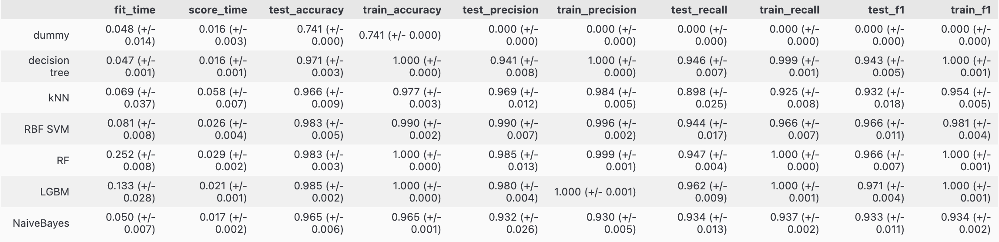

- Exclude abstract, Exclude 3-category author; Use ordinal journal, imputed language

(conclusion: Author seems to be a informative variable)

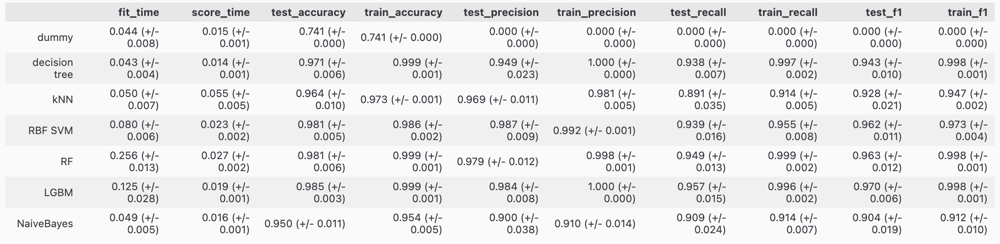

- Include Abstract, use 3-category author, ordinal journal, imputed language
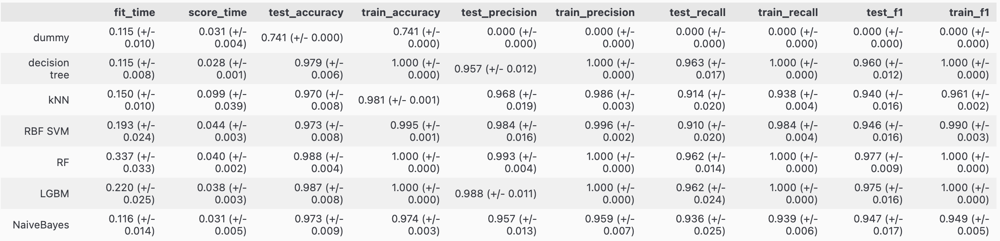

- Drop Year, Include Abstract, use 3-category author, ordinal journal, imputed language

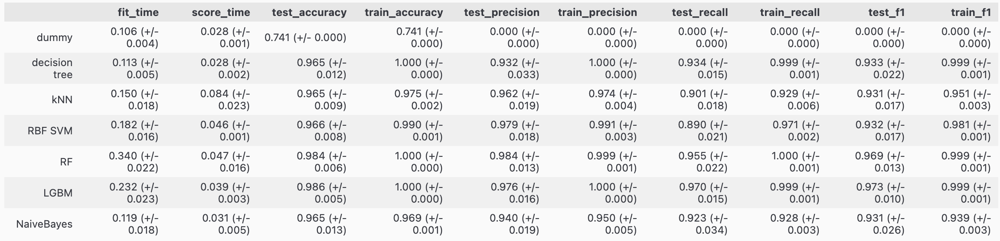

#### LogReg - Hyperparameter Tuning for Logistic Regression

In [ ]:
# from scipy.stats import loguniform, randint

# # fit the model
# logreg_model.fit(X_train, y_train)

# # get the length of the vocabulary
# vocab_len = len(  
#     logreg_model.named_steps["columntransformer"]
#     .named_transformers_["countvectorizer"]
#     .get_feature_names_out()
# )
# # create a distribution of the parameters
# param_dist = {  
#     # "columntransformer__countvectorizer__max_features": np.arange(5000, vocab_len, 200),
#     "logisticregression__C": loguniform(1e-3, 1e3),
#     "logisticregression__class_weight": ["balanced", None],
# }

# # Perform a randomized search 
# random_search = RandomizedSearchCV(  
#     logreg_model,
#     param_distributions=param_dist,
#     n_iter=10,
#     verbose=1,
#     n_jobs=-1,
#     scoring='recall',
#     random_state=123,
# )
# random_search.fit(X_train, y_train)